##### Copyright 2019 The TensorFlow Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# pix2pix: Image-to-image translation with a conditional GAN

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/pix2pix"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This tutorial demonstrates how to build and train a conditional generative adversarial network (cGAN) called pix2pix that learns a mapping from input images to output images, as described in [Image-to-image translation with conditional adversarial networks](https://arxiv.org/abs/1611.07004) by Isola et al. (2017). pix2pix is not application specific—it can be applied to a wide range of tasks, including synthesizing photos from label maps, generating colorized photos from black and white images, turning Google Maps photos into aerial images, and even transforming sketches into photos.

In this example, your network will generate images of building facades using the [CMP Facade Database](http://cmp.felk.cvut.cz/~tylecr1/facade/) provided by the [Center for Machine Perception](http://cmp.felk.cvut.cz/) at the [Czech Technical University in Prague](https://www.cvut.cz/). To keep it short, you will use a [preprocessed copy](https://efrosgans.eecs.berkeley.edu/pix2pix/datasets/) of this dataset created by the pix2pix authors.

In the pix2pix cGAN, you condition on input images and generate corresponding output images. cGANs were first proposed in [Conditional Generative Adversarial Nets](https://arxiv.org/abs/1411.1784) (Mirza and Osindero, 2014)

The architecture of your network will contain:

- A generator with a [U-Net](https://arxiv.org/abs/1505.04597)-based architecture.
- A discriminator represented by a convolutional PatchGAN classifier (proposed in the [pix2pix paper](https://arxiv.org/abs/1611.07004)).

Note that each epoch can take around 15 seconds on a single V100 GPU.

Below are some examples of the output generated by the pix2pix cGAN after training for 200 epochs on the facades dataset (80k steps).

![sample output_1](https://www.tensorflow.org/images/gan/pix2pix_1.png)
![sample output_2](https://www.tensorflow.org/images/gan/pix2pix_2.png)

## Import TensorFlow and other libraries

In [2]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

import numpy as np
from matplotlib import pyplot as plt
from IPython import display

from skimage.metrics import structural_similarity as ssim

In [3]:
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("GPU Devices:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.6.0
Num GPUs Available:  1
GPU Devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Load the dataset

Download the CMP Facade Database data (30MB). Additional datasets are available in the same format [here](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/). In Colab you can select other datasets from the drop-down menu. Note that some of the other datasets are significantly larger (`edges2handbags` is 8GB in size).

In [4]:
# PATH = pathlib.Path("datasets/person-face-sketches")
PATH = pathlib.Path("datasets/CUFS")

In [5]:
list(PATH.parent.iterdir())

[WindowsPath('datasets/CUFS'), WindowsPath('datasets/eval')]

Each original image is of size `256 x 512` containing two `256 x 256` images:

In [6]:
sample_image = tf.io.read_file(str(PATH / 'train/photos/f-005-01.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(250, 200, 3)


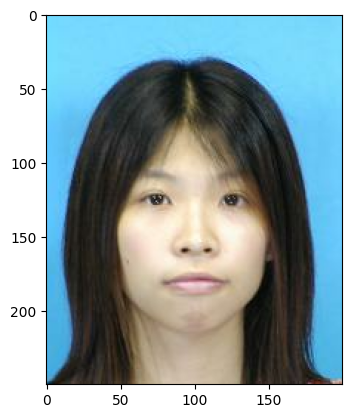

In [7]:
plt.figure()
plt.imshow(sample_image)

You need to separate real building facade images from the architecture label images—all of which will be of size `256 x 256`.

Define a function that loads image files and outputs two image tensors:

In [8]:
def load(photo_file):
    try:
        # 確保路徑是字串格式
        if isinstance(photo_file, tf.Tensor):
            photo_file = photo_file.numpy().decode('utf-8')
            
        # 讀取照片
        photo = tf.io.read_file(photo_file)
        photo = tf.io.decode_jpeg(photo, channels=3)
        
        # 取得對應的素描檔案路徑
        sketch_file = photo_file.replace("photos", "sketches")
        sketch = tf.io.read_file(sketch_file)
        sketch = tf.io.decode_jpeg(sketch, channels=3)
        
        # Resize 到 256x256
        input_image = tf.image.resize(sketch, [256, 256],
                              method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        real_image = tf.image.resize(photo, [256, 256],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

        # 轉換為 float32
        input_image = tf.cast(input_image, tf.float32)
        real_image = tf.cast(real_image, tf.float32)

        return input_image, real_image
        
    except Exception as e:
        print(f"Error processing file {photo_file}: {str(e)}")
        return None, None

# 修改 filter_valid_images 函數
def filter_valid_images(x, y):
    return tf.math.logical_and(
        tf.math.logical_not(tf.math.reduce_any(tf.math.is_nan(x))),
        tf.math.logical_not(tf.math.reduce_any(tf.math.is_nan(y)))
    )



Plot a sample of the input (architecture label image) and real (building facade photo) images:

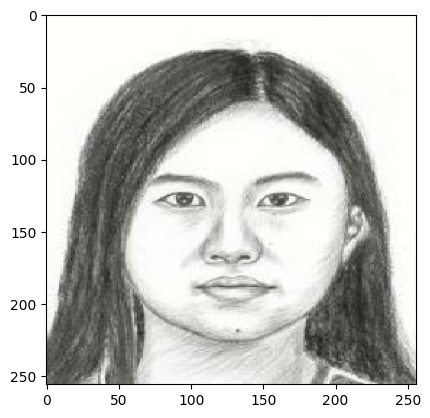

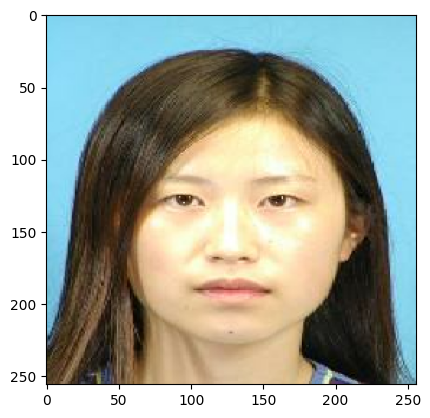

In [9]:
inp, re = load(str(PATH / 'train/photos/f-039-01.jpg'))
# Casting to int for matplotlib to display the images

plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

As described in the [pix2pix paper](https://arxiv.org/abs/1611.07004), you need to apply random jittering and mirroring to preprocess the training set.

Define several functions that:

1. Resize each `256 x 256` image to a larger height and width—`286 x 286`.
2. Randomly crop it back to `256 x 256`.
3. Randomly flip the image horizontally i.e., left to right (random mirroring).
4. Normalize the images to the `[-1, 1]` range.

In [10]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [11]:
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width],
                                  method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

In [12]:
def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(
        stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

In [13]:
def normalize(input_image, real_image):
    # 將 [0, 255] 轉換為 [-1, 1]
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1
    return input_image, real_image

In [14]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

You can inspect some of the preprocessed output:

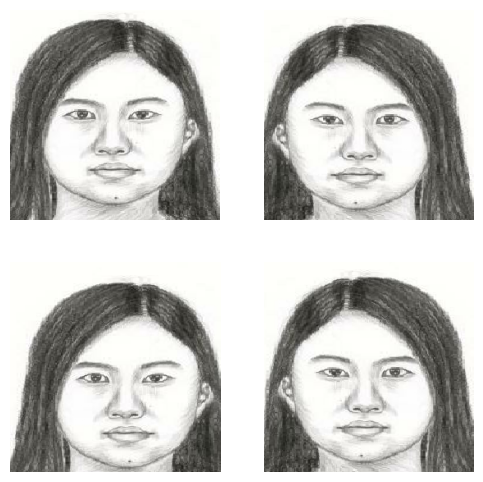

In [15]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

Having checked that the loading and preprocessing works, let's define a couple of helper functions that load and preprocess the training and test sets:

In [16]:
def is_valid_image_pair(input_image, real_image):
    # 確保輸入不是 None
    if input_image is None or real_image is None:
        return False
        
    return tf.math.logical_and(
        tf.math.logical_not(tf.math.reduce_any(tf.math.is_nan(x))),
        tf.math.logical_not(tf.math.reduce_any(tf.math.is_nan(y)))
    )

In [17]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)
    
    return input_image, real_image

In [18]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)
    return input_image, real_image

## Build an input pipeline with `tf.data`

In [19]:
def create_dataset(file_pattern, batch_size, is_training=True):
    # 使用 glob 先取得檔案列表
    files = tf.io.gfile.glob(file_pattern)
    if not files:
        raise ValueError(f"No files found matching pattern: {file_pattern}")
        
    # 建立資料集
    dataset = tf.data.Dataset.from_tensor_slices(files)
    
    if is_training:
        dataset = dataset.shuffle(buffer_size=len(files))
    
    # 使用 py_function 包裝 load 函數以處理編碼問題
    def load_wrapper(path):
        if is_training:
            # 使用 load_image_train 處理訓練資料
            input_image, real_image = tf.py_function(
                load_image_train,
                [path],
                [tf.float32, tf.float32]
            )
        else:
            # 使用 load_image_test 處理測試資料
            input_image, real_image = tf.py_function(
                load_image_test,
                [path],
                [tf.float32, tf.float32]
            )

        # 設定張量的形狀
        input_image.set_shape([IMG_HEIGHT, IMG_WIDTH, 3])
        real_image.set_shape([IMG_HEIGHT, IMG_WIDTH, 3])
        return input_image, real_image
    
    # 載入和處理圖片
    dataset = dataset.map(
        load_wrapper,
        num_parallel_calls=tf.data.AUTOTUNE
    )
    
    # 過濾無效的圖片
    dataset = dataset.filter(
        lambda x, y: tf.logical_and(
            tf.reduce_all(tf.math.is_finite(x)),
            tf.reduce_all(tf.math.is_finite(y))
        )
    )
    
    # 設定批次大小
    dataset = dataset.batch(batch_size)
    
    # 預取資料
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

In [20]:
train_dataset = create_dataset(str(PATH / 'train/photos/*.jpg'), BATCH_SIZE, is_training=True)
valid_dataset = create_dataset(str(PATH / 'val/photos/*.jpg'), BATCH_SIZE, is_training=False)

In [21]:
img1, img2 = load_image_train(str(PATH / 'train/photos/f-039-01.jpg'))

print(f"Range: [{tf.reduce_min(img1):.2f}, {tf.reduce_max(img1):.2f}]")
print(f"Range: [{tf.reduce_min(img2):.2f}, {tf.reduce_max(img2):.2f}]")

Range: [-0.84, 1.00]
Range: [-1.00, 1.00]


In [22]:
# 驗證資料集
def validate_dataset(dataset, name="Dataset"):
    try:
        print(f"\nValidating {name}...")
        for batch in dataset.take(1):
            if not isinstance(batch, tuple) or len(batch) != 2:
                print(f"Error: {name} does not have the expected structure")
                return False
                
            input_image, target = batch
            print(f"Batch shapes: input={input_image.shape}, target={target.shape}")
            print(f"Data ranges: input=[{tf.reduce_min(input_image)}, {tf.reduce_max(input_image)}], "
                  f"target=[{tf.reduce_min(target)}, {tf.reduce_max(target)}]")
            
            # 檢查是否有無效值
            if tf.reduce_any(tf.math.is_nan(input_image)) or tf.reduce_any(tf.math.is_nan(target)):
                print(f"Warning: {name} contains NaN values")
                return False
                
        return True
    except Exception as e:
        print(f"Error validating {name}: {str(e)}")
        return False

# 執行驗證
train_valid = validate_dataset(train_dataset, "Training Dataset")
test_valid = validate_dataset(valid_dataset, "Valid Dataset")

if not (train_valid and test_valid):
    raise ValueError("Dataset validation failed")


Validating Training Dataset...
Batch shapes: input=(1, 256, 256, 3), target=(1, 256, 256, 3)
Data ranges: input=[-0.8588235378265381, 1.0], target=[-1.0, 1.0]

Validating Valid Dataset...
Batch shapes: input=(1, 256, 256, 3), target=(1, 256, 256, 3)
Data ranges: input=[-1.0, 1.0], target=[-1.0, 1.0]


In [23]:
# 添加資料集驗證
print("Validating training dataset...")
for batch in train_dataset.take(1):
    input_image, target = batch
    print(f"Training batch shapes: input={input_image.shape}, target={target.shape}")
    print(f"Training data ranges: input=[{tf.reduce_min(input_image)}, {tf.reduce_max(input_image)}], target=[{tf.reduce_min(target)}, {tf.reduce_max(target)}]")

print("\nValidating test dataset...")
for batch in valid_dataset.take(1):
    input_image, target = batch
    print(f"Test batch shapes: input={input_image.shape}, target={target.shape}")
    print(f"Test data ranges: input=[{tf.reduce_min(input_image)}, {tf.reduce_max(input_image)}], target=[{tf.reduce_min(target)}, {tf.reduce_max(target)}]")

Validating training dataset...
Training batch shapes: input=(1, 256, 256, 3), target=(1, 256, 256, 3)
Training data ranges: input=[-0.8745098114013672, 1.0], target=[-1.0, 1.0]

Validating test dataset...
Test batch shapes: input=(1, 256, 256, 3), target=(1, 256, 256, 3)
Test data ranges: input=[-1.0, 1.0], target=[-1.0, 1.0]


## Build the generator

The generator of your pix2pix cGAN is a _modified_ [U-Net](https://arxiv.org/abs/1505.04597). A U-Net consists of an encoder (downsampler) and decoder (upsampler). (You can find out more about it in the [Image segmentation](../images/segmentation.ipynb) tutorial and on the [U-Net project website](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/).)

- Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
- Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU
- There are skip connections between the encoder and decoder (as in the U-Net).

Define the downsampler (encoder):

In [24]:
OUTPUT_CHANNELS = 3

In [25]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [26]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


Define the upsampler (decoder):

In [27]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [28]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


Define the generator with the downsampler and the upsampler:

In [29]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualize the generator model architecture:

In [30]:
generator = Generator()
# tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_3 (Sequential)       (None, 64, 64, 128)  131584      sequential_2[0][0]               
__________________________________________________________________________________________________
sequential_4 (Sequential)       (None, 32, 32, 256)  525312      sequential_3[0][0]               
______________________________________________________________________________________________

Test the generator:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


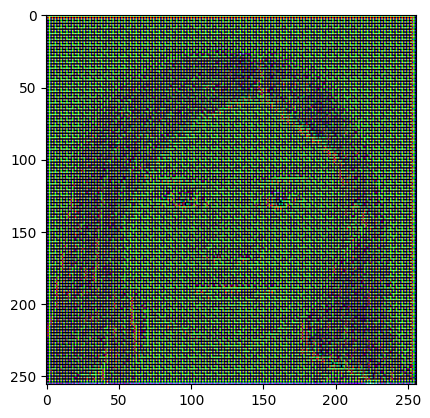

In [31]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

### Define the generator loss

GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- The generator loss is a sigmoid cross-entropy loss of the generated images and an **array of ones**.
- The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss is `gan_loss + LAMBDA * l1_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.

In [32]:
LAMBDA = 100

In [33]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [34]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

The training procedure for the generator is as follows:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Build the discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image _patch_ is real or not real, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image.
- The discriminator receives 2 inputs:
    - The input image and the target image, which it should classify as real.
    - The input image and the generated image (the output of the generator), which it should classify as fake.
    - Use `tf.concat([inp, tar], axis=-1)` to concatenate these 2 inputs together.

Let's define the discriminator:

In [35]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualize the discriminator model architecture:

In [36]:
discriminator = Discriminator()
# tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_17 (Sequential)      (None, 128, 128, 64) 6144        concatenate_7[0][0]        

Test the discriminator:

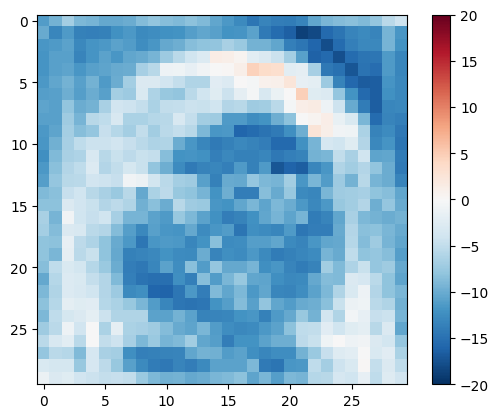

In [37]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

### Define the discriminator loss

- The `discriminator_loss` function takes 2 inputs: **real images** and **generated images**.
- `real_loss` is a sigmoid cross-entropy loss of the **real images** and an **array of ones(since these are the real images)**.
- `generated_loss` is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros (since these are the fake images)**.
- The `total_loss` is the sum of `real_loss` and `generated_loss`.

In [39]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

The training procedure for the discriminator is shown below.

To learn more about the architecture and the hyperparameters you can refer to the [pix2pix paper](https://arxiv.org/abs/1611.07004).

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Define the optimizers and a checkpoint-saver


In [40]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [41]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate images

Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and _voila_!

Note: The `training=True` is intentional here since you want the batch statistics, while running the model on the test dataset. If you use `training=False`, you get the accumulated statistics learned from the training dataset (which you don't want).

In [42]:
def calculate_metrics(generated_image, target_image):
    """
    Calculate SSIM and L2 norm between generated and target images
    
    Args:
        generated_image: Generated image tensor [-1,1]
        target_image: Target image tensor [-1,1]
    Returns:
        ssim_score: SSIM score
        l2_norm: L2 norm (Euclidean distance)
    """
    # Convert from [-1,1] to [0,1] range
    generated_image = (generated_image + 1) * 0.5
    target_image = (target_image + 1) * 0.5
    
    # Convert to numpy arrays
    generated_np = tf.clip_by_value(generated_image, 0, 1).numpy()
    target_np = tf.clip_by_value(target_image, 0, 1).numpy()
    
    # Calculate SSIM
    ssim_score = ssim(target_np, generated_np, 
                      data_range=1.0,
                      multichannel=True)
    
    # Calculate L2 norm
    l2_norm = np.linalg.norm(target_np - generated_np)
    
    return ssim_score, l2_norm

In [53]:
def generate_images(model, test_input, tar, show_image=True, show_metrics=True, show_gt=True):
    prediction = model(test_input, training=True)
    
    if show_metrics:
        ssim_score, l2_norm = calculate_metrics(prediction[0], tar[0])
        print(f'SSIM Score: {ssim_score:.4f}')
        print(f'L2 Norm: {l2_norm:.4f}')

    if show_image:
        if show_gt:
            plt.figure(figsize=(15, 15))
            display_list = [test_input[0], tar[0], prediction[0]]
            title = ['Input Image', 'Ground Truth', 'Predicted Image']
        else:
            plt.figure(figsize=(15, 15))
            display_list = [test_input[0], prediction[0]]
            title = ['Input Image', 'Predicted Image']
            
        for i in range(len(display_list)):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            
            # 取得當前圖片
            img = display_list[i]
            
            img = (img + 1) * 0.5
            img = tf.clip_by_value(img, 0, 1)
            
            plt.imshow(img)
            plt.axis('off')

In [44]:
def evaluate_model(model, dataset, num_samples=18):
    """
    Evaluate model on a dataset and calculate average metrics
    """
    ssim_scores = []
    l2_norms = []
    
    for inp, tar in dataset.take(num_samples):
        # Generate predictions
        prediction = model(inp, training=True)
        
        # Calculate metrics
        ssim_score, l2_norm = calculate_metrics(prediction[0], tar[0])
        ssim_scores.append(ssim_score)
        l2_norms.append(l2_norm)
    
    # Calculate and display average metrics
    avg_ssim = np.mean(ssim_scores)
    avg_l2 = np.mean(l2_norms)
    print('\nAverage Metrics:')
    print(f'Average SSIM: {avg_ssim:.4f}')
    print(f'Average L2 Norm: {avg_l2:.4f}')
    
    return avg_ssim, avg_l2

Test the function:

SSIM Score: 0.5767
L2 Norm: 71.8102


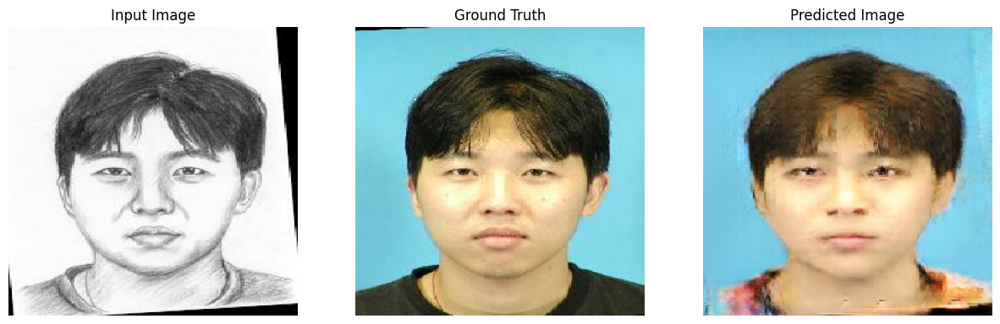

In [54]:
for example_input, example_target in valid_dataset.take(1):
    generate_images(generator, example_input, example_target)

## Training

- For each example input generates an output.
- The discriminator receives the `input_image` and the generated image as the first input. The second input is the `input_image` and the `target_image`.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
- Finally, log the losses to TensorBoard.

In [45]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [210]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

The actual training loop. Since this tutorial can run of more than one dataset, and the datasets vary greatly in size the training loop is setup to work in steps instead of epochs.

- Iterates over the number of steps.
- Every 10 steps print a dot (`.`).
- Every 1k steps: clear the display and run `generate_images` to show the progress.
- Every 5k steps: save a checkpoint.

In [211]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

This training loop saves logs that you can view in TensorBoard to monitor the training progress.

If you work on a local machine, you would launch a separate TensorBoard process. When working in a notebook, launch the viewer before starting the training to monitor with TensorBoard.

Launch the TensorBoard viewer (Sorry, this doesn't
display on tensorflow.org):

In [212]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 7180), started 2:49:02 ago. (Use '!kill 7180' to kill it.)

You can view the [results of a previous run](https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw) of this notebook on [TensorBoard.dev](https://tensorboard.dev/).

Finally, run the training loop:

Time taken for 1000 steps: 86.75 sec



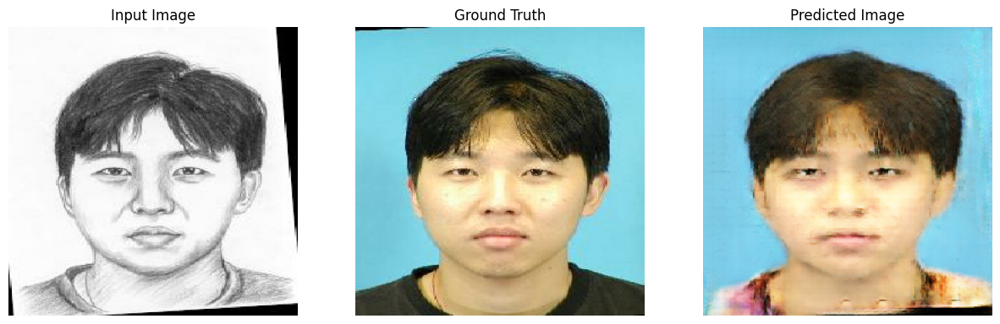

Step: 39k
....................................................................................................

In [213]:
fit(train_dataset, valid_dataset, steps=40000)

Interpreting the logs is more subtle when training a GAN (or a cGAN like pix2pix) compared to a simple classification or regression model. Things to look for:

- Check that neither the generator nor the discriminator model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low, it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
- The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2 - the discriminator is, on average, equally uncertain about the two options.
- For the `disc_loss`, a value below `0.69` means the discriminator is doing better than random on the combined set of real and generated images.
- For the `gen_gan_loss`, a value below `0.69` means the generator is doing better than random at fooling the discriminator.
- As training progresses, the `gen_l1_loss` should go down.

## Restore the latest checkpoint and test the network

In [47]:
!ls {checkpoint_dir}

'ls' ���O�����Υ~���R�O�B�i���檺�{���Χ妸�ɡC


In [48]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Generate some images using the test set

In [49]:
test_dataset = create_dataset(str(PATH / 'test/photos/*.jpg'), BATCH_SIZE, is_training=False)

SSIM Score: 0.5986
L2 Norm: 73.2005
SSIM Score: 0.6315
L2 Norm: 71.2754
SSIM Score: 0.5891
L2 Norm: 67.5309
SSIM Score: 0.5879
L2 Norm: 64.4645
SSIM Score: 0.6209
L2 Norm: 46.9194


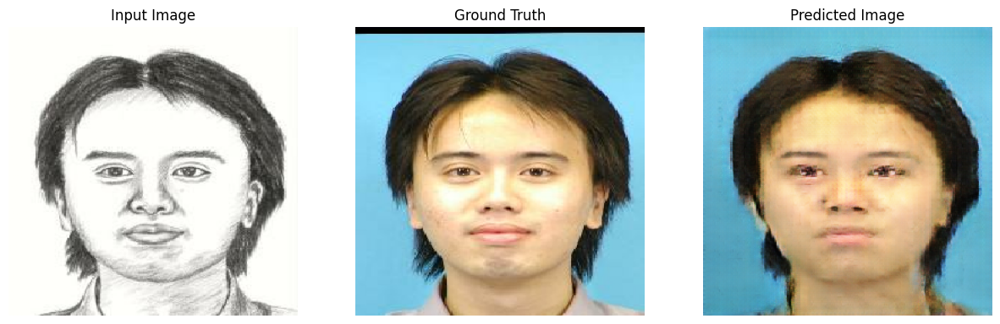

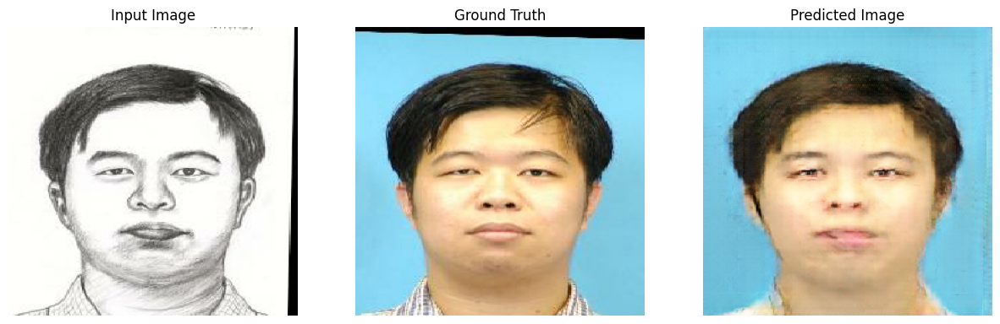

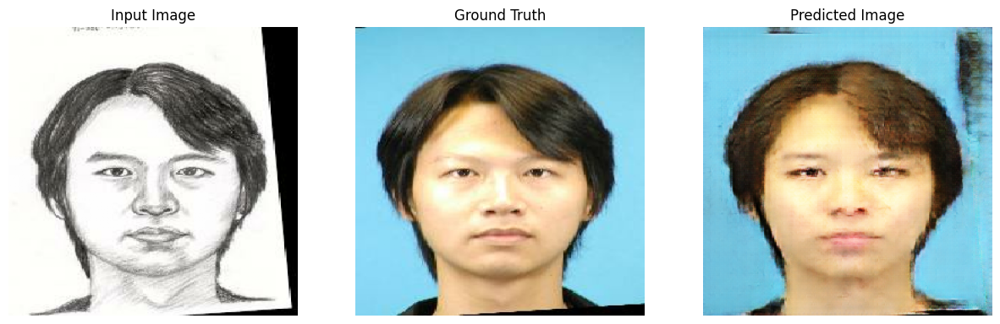

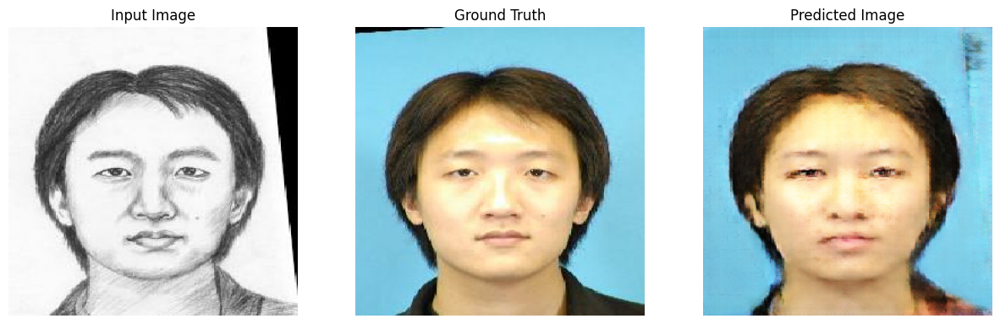

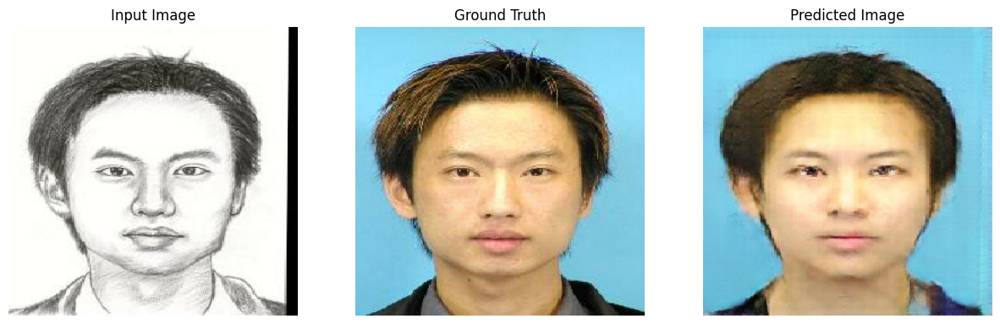

In [50]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [70]:
# 評估驗證集
print("\nEvaluating on validation dataset:")
test_dataset = create_dataset(str(PATH / 'test/photos/*.jpg'), BATCH_SIZE, is_training=False)
avg_ssim, avg_l2 = evaluate_model(generator, test_dataset)


Evaluating on validation dataset:

Average Metrics:
Average SSIM: 0.6349
Average L2 Norm: 56.3501


In [58]:
test_dataset2 = create_dataset(str(pathlib.Path("datasets/eval") / 'photos/*.jpg'), BATCH_SIZE, is_training=False)

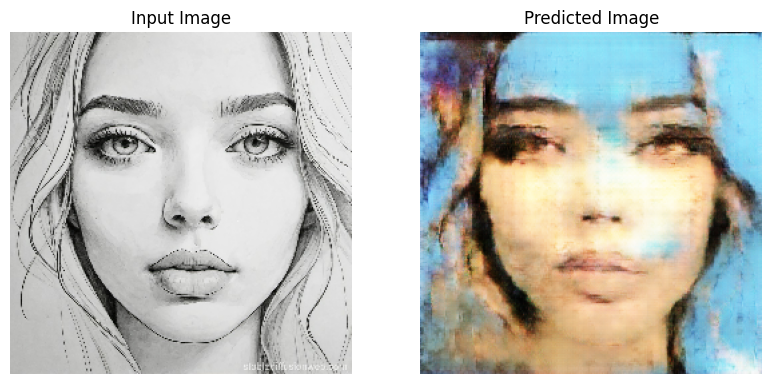

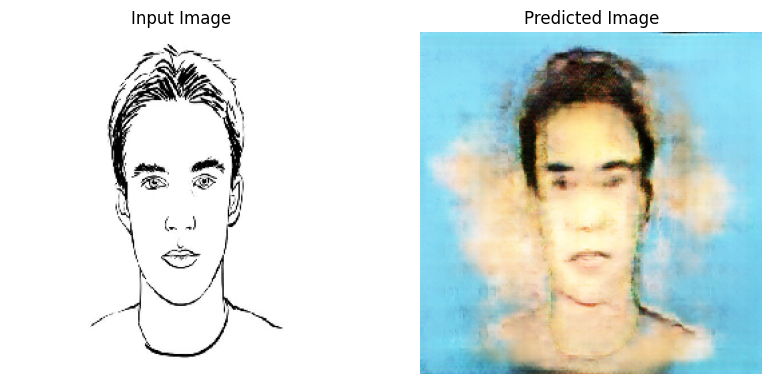

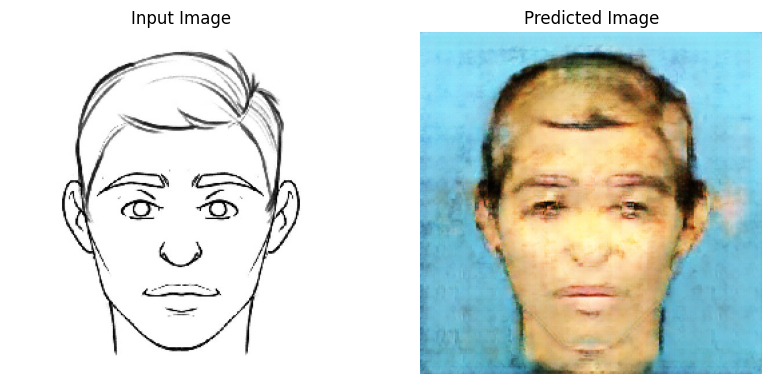

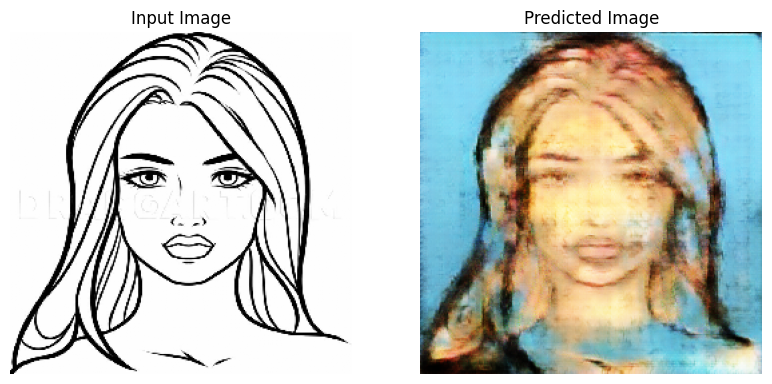

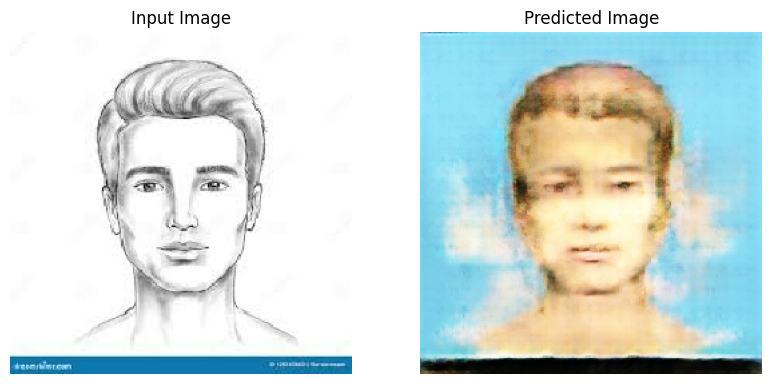

In [60]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset2.take(5):
  generate_images(generator, inp, tar, show_metrics=False, show_gt=False)